# Supplementary code for paper "Interpretable Recognition of Cognitive Distortions in Natural Language Texts"

In [56]:
import os, sys
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
import datetime as dt
import plotly.graph_objects as go

#force reimport
if 'api' in sys.modules:
    del sys.modules['api']
if 'plot' in sys.modules:
    del sys.modules['plot']
if 'util' in sys.modules:
    del sys.modules['util']
if 'recognition_evaluators' in sys.modules:
    del sys.modules['recognition_evaluators']

from api import TextMetrics, load_ngrams, punct, tokenize_re, build_ngrams, Learner
from plot import plot_dict, plot_dict_bars, matrix_plot, plot_bar_from_list, \
    build_triple_list, build_triple_matrix, plot_bar_from_list_minmax
from util import dictcount, contains_seq, agg_min_max_avg_mpe
from recognition_evaluators import df2labeled, language_metrics, our_evaluator_test, our_evaluator_tm, our_evaluator_top, \
    our_evaluator_true, our_evaluator_false, our_evaluator_random, pre_rec_f1_from_counts, evaluate_tm_df, evaluate_metrics, evaluate_model, \
    full_test_circle, dictval, our_evaluator_top1, summarize_full_test_circle

grand_t0 = dt.datetime.now()

[nltk_data] Downloading package punkt to /Users/akolonin/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
# Paper section: "Models with Data Provided" 
# The first and so far the only one publicly available dataset with multiple distortions 
# markup based or real world interactions between therapists and clients (Shreevastava 2021)

# Dataset: Multiple Distorions (sagarikashreevastava)
# Paper: https://aclanthology.org/2021.clpsych-1.17/
# Data: https://www.kaggle.com/datasets/sagarikashreevastava/cognitive-distortion-detetction-dataset

DS = 'Shreevastava21'

# !pip install kagglehub
import kagglehub
multiclass_dataset_path = kagglehub.dataset_download("sagarikashreevastava/cognitive-distortion-detetction-dataset")
multiclass_dataset_file_path = multiclass_dataset_path + "/Annotated_data.csv"

df = pd.read_csv(multiclass_dataset_file_path) 
df = df.drop('Id_Number', axis=1) # delete columnb with id 

validation_fraction = 10
held_fraction = 10 # withheld test set
train_df = df[df.index % held_fraction != 0].reset_index(drop=True)
held_df  = df[df.index % held_fraction == 0].reset_index(drop=True)

print('Total',len(df))
print('Train and validation',len(train_df))
print('Withheld test',len(held_df))

df = train_df
df

Total 2530
Train and validation 2277
Withheld test 253


,Patient Question,Distorted part,Dominant Distortion,Secondary Distortion (Optional)
0,Since I was about 16 years old I’ve had these ...,I feel trapped inside my disgusting self and l...,Labeling,Emotional Reasoning
1,So I’ve been dating on and off this guy for a...,NaN,No Distortion,NaN
2,My parents got divorced in 2004. My mother has...,NaN,No Distortion,NaN
3,I don’t really know how to explain the situati...,I refused to go because I didn’t know if it wa...,Fortune-telling,Emotional Reasoning
4,Hello. I have been friend with a guy since gra...,NaN,No Distortion,NaN
...,...,...,...,...
2272,I’m a 21 year old female. I spent most of my l...,NaN,No Distortion,NaN
2273,I am 21 female and have not had any friends fo...,Now I am at university my peers around me all ...,Overgeneralization,NaN
2274,From the U.S.: My brother is 19 years old and ...,He claims he’s severely depressed and has outb...,Mental filter,Mind Reading
2275,From the U.S.: I am a 21 year old woman who ha...,NaN,No Distortion,NaN


In [3]:
#Paper Section: "Experimental Setup"

model_multiclass_path = '../../data/models/distortions/shreevastava2021_t'
model_name = 'multiclass'
rescale = False
inclusion_thresholds = [0,10,20,30,40,50,60,70,80,90]
detection_thresholds = [10,20,30,40,50,60,70,80,90]
selection_metrics = ['F','UF','FN','UFN','TF-IDF','FCR','CFR','MR','NLMI']
n_max_values = [1,2,3,4,5]
splits = [0,1,2]

if not os.path.exists(model_multiclass_path):
    os.makedirs(model_multiclass_path)
print(model_multiclass_path)

../../data/models/distortions/shreevastava2021_t


# Grid search
## Perform a grid search over all hyper-parameters to determine the best combination for building the model
### Non-Weighted Model and Recognition

In [4]:
# Paper section: "Experimental Setup" 

results1 = []
for shift in splits:
    accumulator = []
    for n_max in n_max_values:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=inclusion_thresholds,
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = selection_metrics,
                weighted=False,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results1.append(accumulator)


Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statements': 108})
Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statements': 108})
Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statemen

In [5]:
# Search the best hyper-parameters based on three runs with min, max and average F1 and its MPE evaluated  

summary = []
for l1,l2,l3 in zip(results1[0],results1[1],results1[2]):
    summary.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary = sorted(summary, key=lambda x: (-x[6],x[2],x[0],-x[1],x[3])) # sort by -F1avg, SM, NM, -IT, RT
NM, IT, SM, DT = summary[0][:4]
F1 = summary[0][6]
print(f'DS={DS}, NM={NM}, IT={IT}, SM={SM}, DT={DT}, F1={F1}')
print()
for s in summary[:20]:
    print(s)

DS=Shreevastava21, NM=2, IT=20, SM=UFN, DT=60, F1=0.4170719375370538

(2, 20, 'UFN', 60, 0.3397441077441078, 0.47212698412698406, 0.4170719375370538, 12.360430393150265)
(3, 20, 'FCR', 60, 0.3403020371441424, 0.4656205802479095, 0.4136212973825228, 11.817454066051726)
(3, 30, 'UFN', 60, 0.3444789081885856, 0.5092406826889586, 0.40401764140362584, 17.362779988149367)
(2, 10, 'FCR', 70, 0.37579984964488494, 0.4241300366300367, 0.40287649692133326, 4.480553798059753)
(3, 30, 'FN', 60, 0.3457692307692308, 0.49194250194250183, 0.4006658156658156, 15.187500856127873)
(2, 10, 'FN', 70, 0.3657243544434309, 0.44219274093629296, 0.3989917993960089, 7.218350787439968)
(5, 70, 'FN', 50, 0.32190372595919825, 0.4855510571300045, 0.395548419759893, 15.16925747880967)
(5, 70, 'UFN', 50, 0.32190372595919825, 0.4855510571300045, 0.395548419759893, 15.16925747880967)
(5, 60, 'FN', 50, 0.3263179413179413, 0.48895967915931615, 0.39514173722582674, 15.828572061619784)
(5, 90, 'FN', 50, 0.3146262932469829, 0

Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statements': 108})


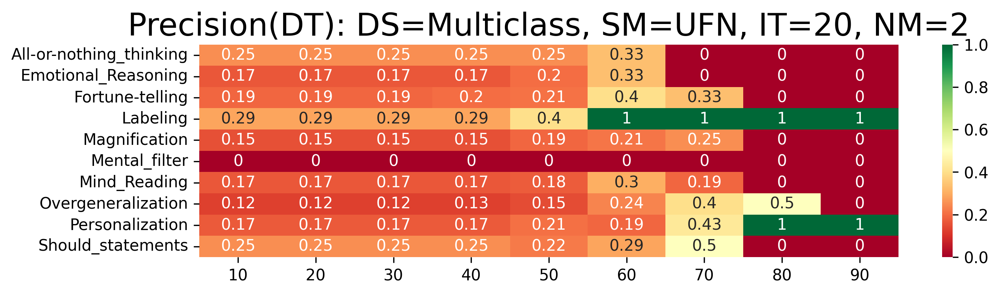

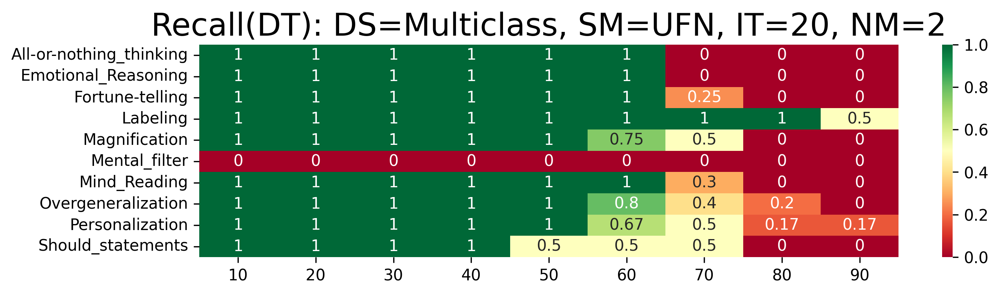

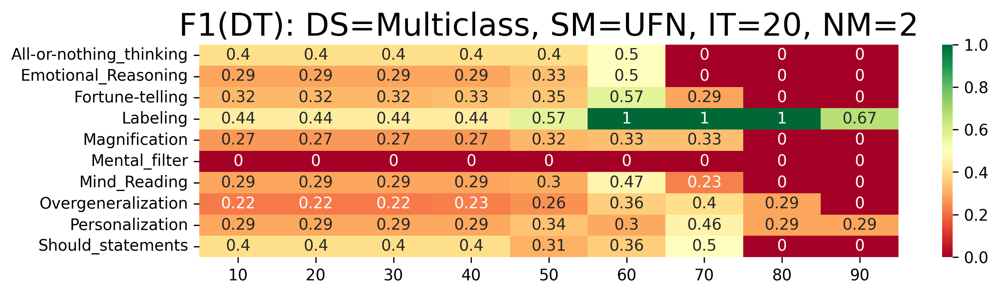

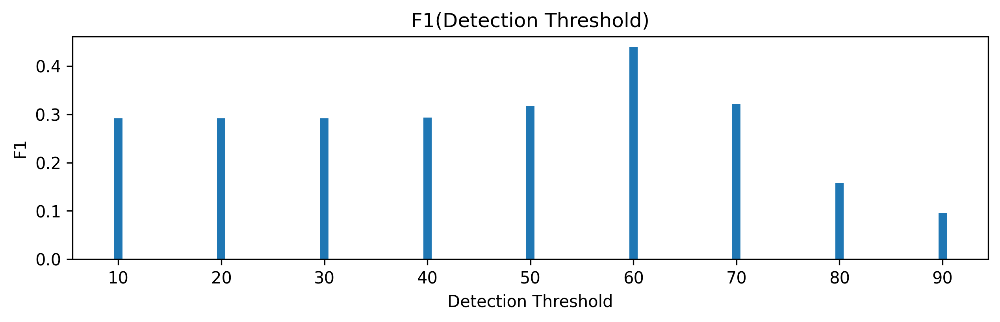

In [6]:
# Explore precison, recall and F1 for specific distortions with best NM, SM, and IT for range of DT 

shift = 0
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=False,all_scores=True,averages=True,split_shift=shift,evaluator=our_evaluator_top1)

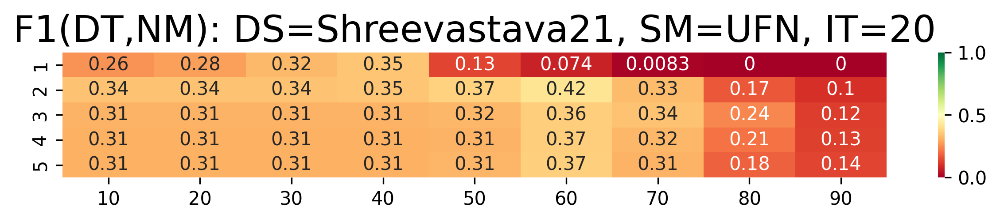

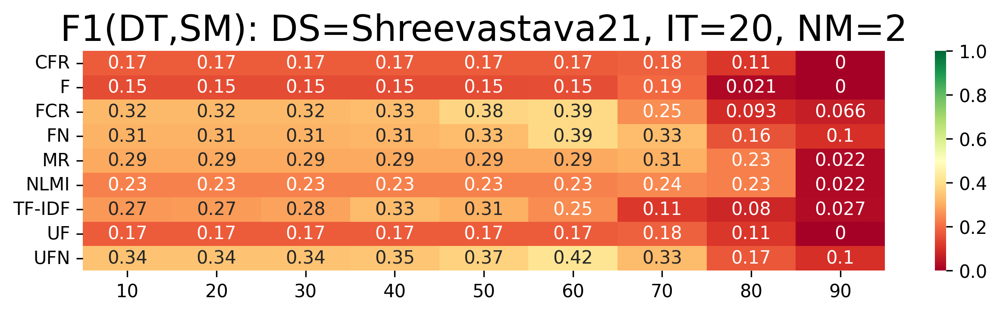

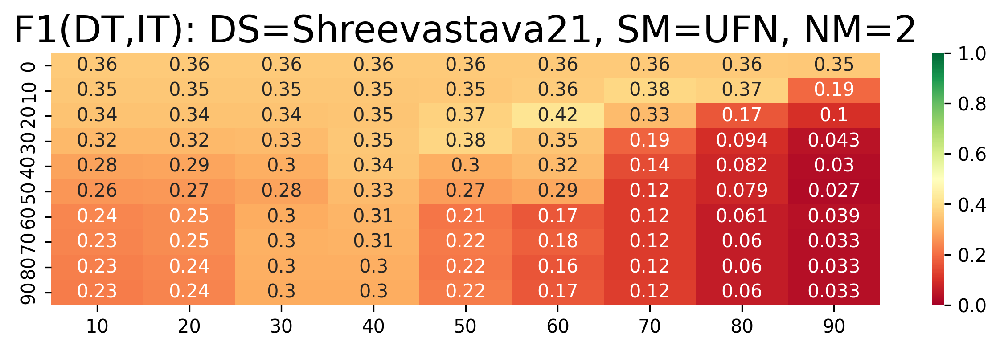

In [7]:
# Render average F1 scores for ranges of NM, SM, and IT and range of DT 

m = build_triple_matrix(summary,0,3,{2:SM,1:IT},6,n_max_values,detection_thresholds)
matrix_plot(n_max_values, detection_thresholds, m, 1.0, title = f'F1(DT,NM): DS={DS}, SM={SM}, IT={IT}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary,2,3,{0:NM,1:IT},6,selection_metrics,detection_thresholds)
matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={IT}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary,1,3,{0:NM,2:SM},6,inclusion_thresholds, detection_thresholds)
matrix_plot(sorted(inclusion_thresholds), detection_thresholds, m, 1.0, title = f'F1(DT,IT): DS={DS}, SM={SM}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


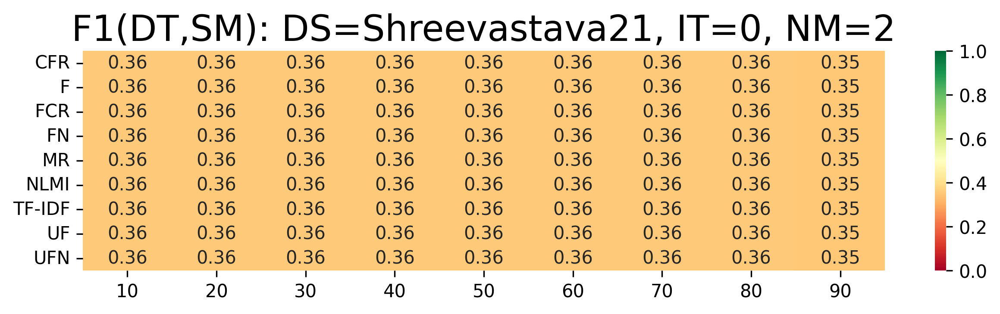

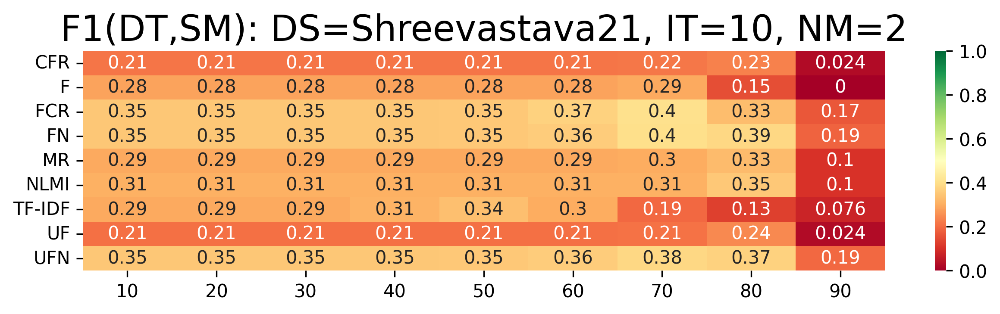

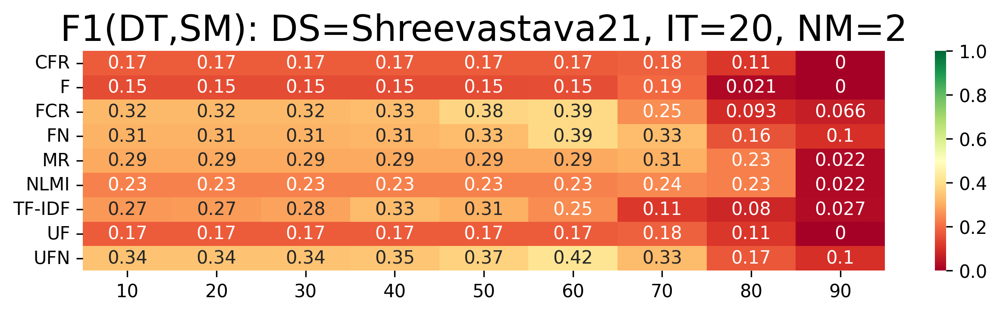

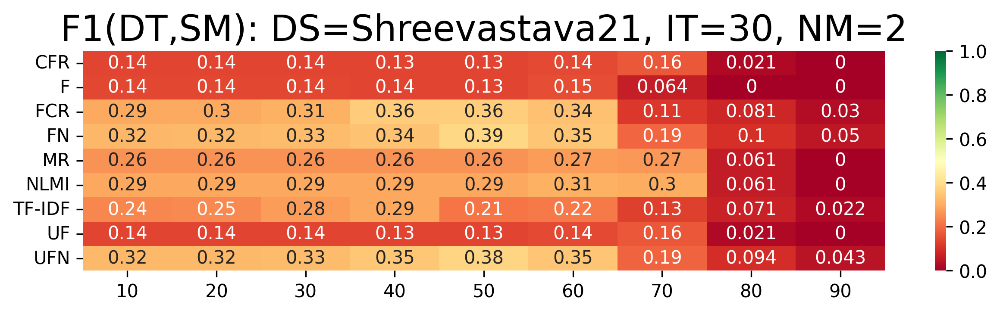

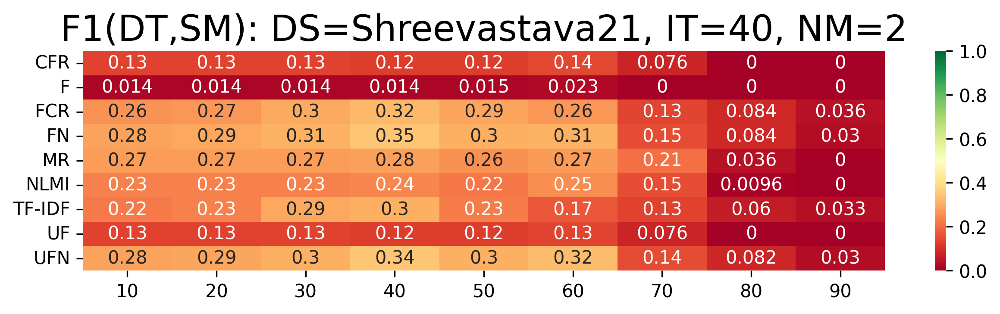

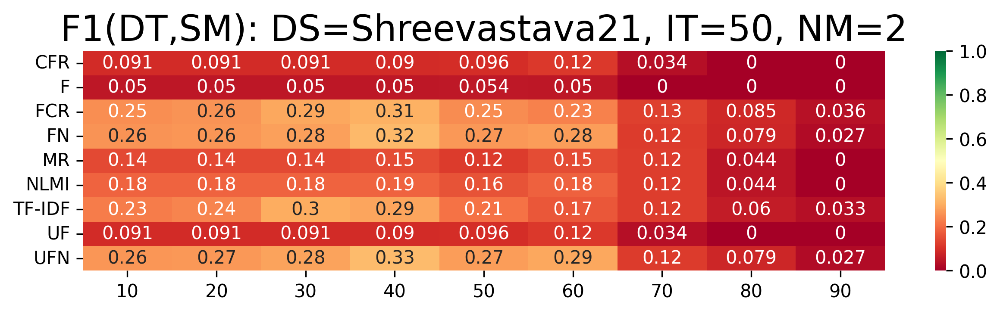

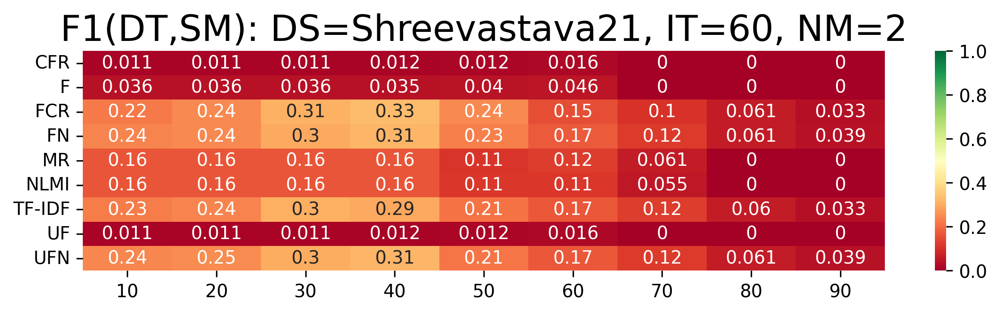

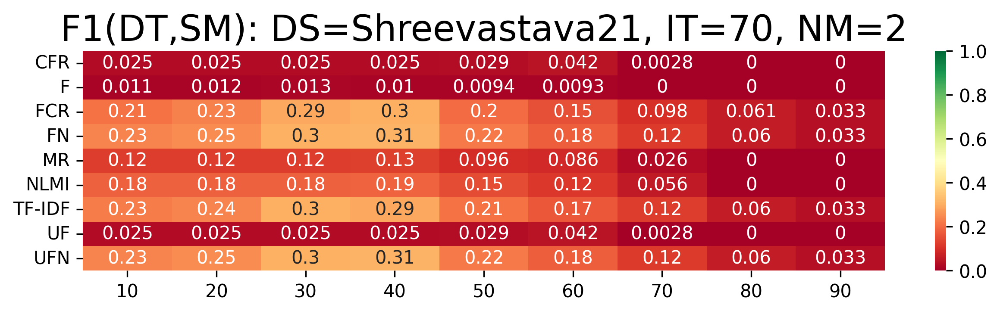

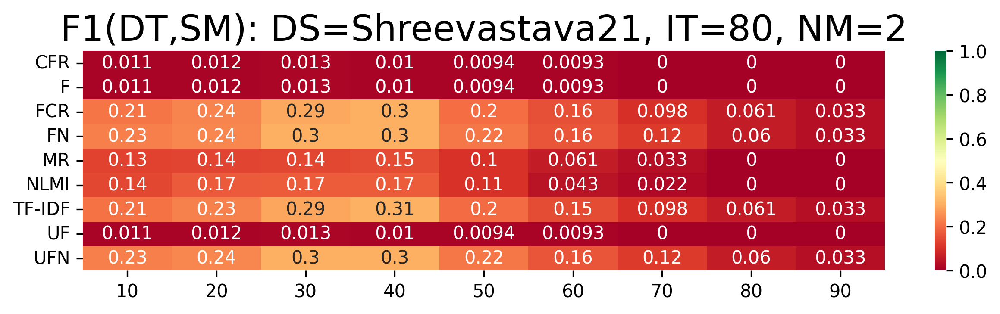

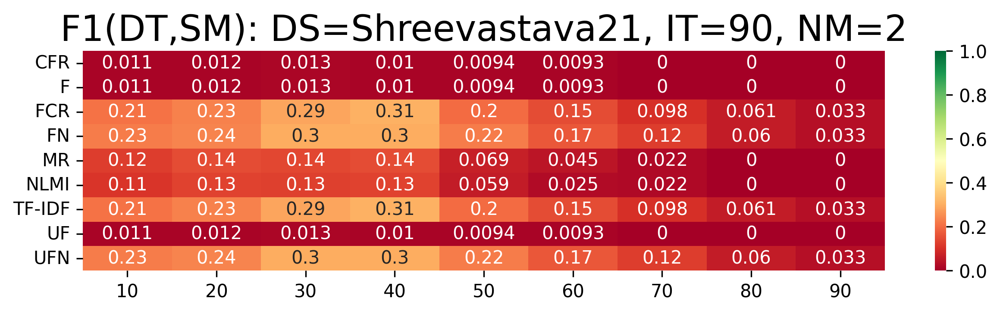

In [8]:
# Visualize how different SM perform with different IT and DT

for it in inclusion_thresholds:
    m = build_triple_matrix(summary,2,3,{0:NM,1:it},6,selection_metrics,detection_thresholds)
    matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={it}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


### Weighted Model and Recognition

In [9]:
# Paper section: "Experimental Setup" 

results1 = []
for shift in splits:
    accumulator = []
    for n_max in n_max_values:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=inclusion_thresholds,
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = selection_metrics,
                weighted=True,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results1.append(accumulator)


Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statements': 108})
Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statements': 108})
Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statemen

In [10]:
# Search the best hyper-parameters based on three runs with min, max and average F1 and its MPE evaluated  

summary_weighted = []
for l1,l2,l3 in zip(results1[0],results1[1],results1[2]):
    summary_weighted.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_weighted = sorted(summary_weighted, key=lambda x: (-x[6],x[2],x[0],-x[1],x[3])) # sort by -F1avg, SM, NM, -IT, RT
NM, IT, SM, DT = summary_weighted[0][:4]
F1 = summary_weighted[0][6]
print(f'DS={DS}, NM={NM}, IT={IT}, SM={SM}, DT={DT}, F1={F1}')
print()
for s in summary_weighted[:20]:
    print(s)

DS=Shreevastava21, NM=4, IT=0, SM=UF, DT=10, F1=0.4501942131797456

(4, 0, 'UF', 10, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 20, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 30, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 40, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 50, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 60, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 70, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 80, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'UF', 90, 0.3136363636363636, 0.6178265851795264, 0.4501942131797456, 24.82371194360533)
(4, 0, 'F', 10, 0.17936301148911885, 0.6057765483792994, 0.441209342

Shift=0: train=2049, test=228
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 760, 'Fortune-telling': 167, 'Emotional_Reasoning': 141, 'Magnification': 193, 'Mind_Reading': 244, 'Personalization': 156, 'All-or-nothing_thinking': 99, 'Overgeneralization': 230, 'Labeling': 163, 'Mental_filter': 129, 'Should_statements': 108})


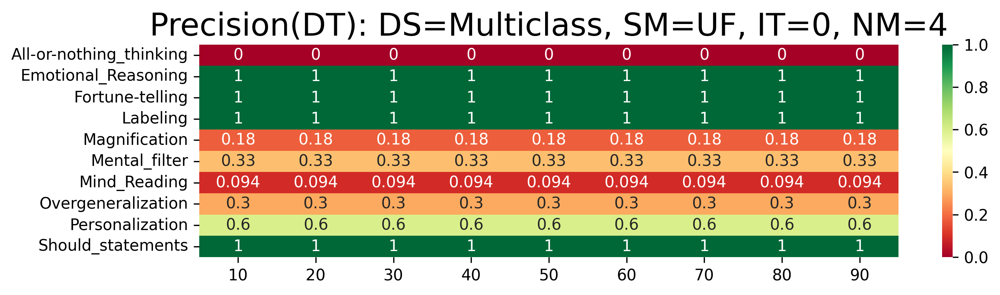

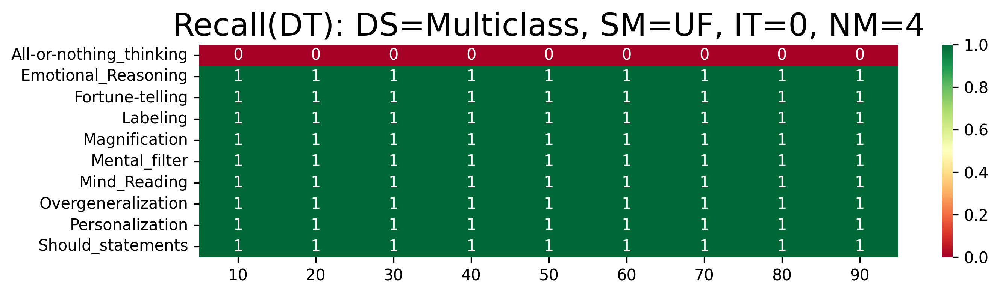

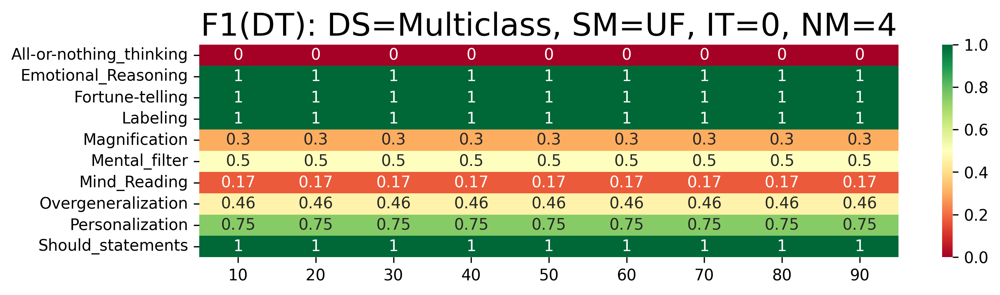

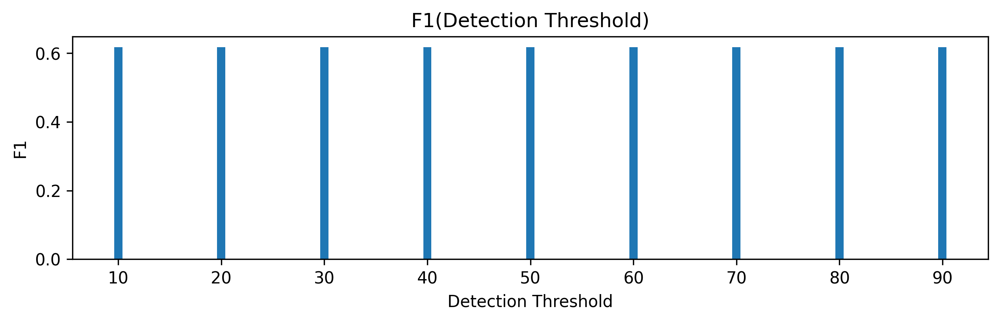

In [11]:
# Explore precison, recall and F1 for specific distortions with best NM, SM, and IT for range of DT 

shift = 0
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=True,all_scores=True,averages=True,split_shift=shift,evaluator=our_evaluator_top1)

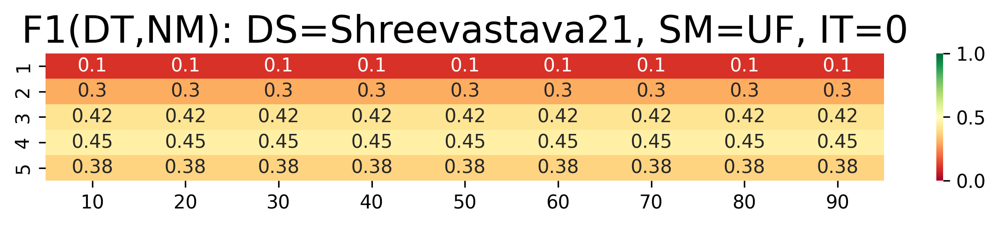

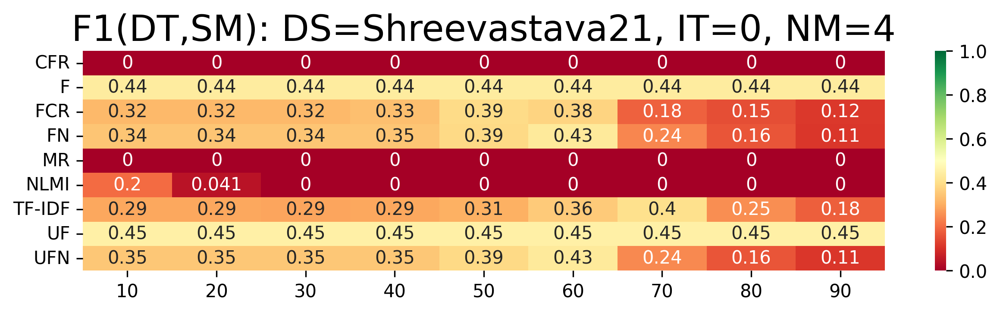

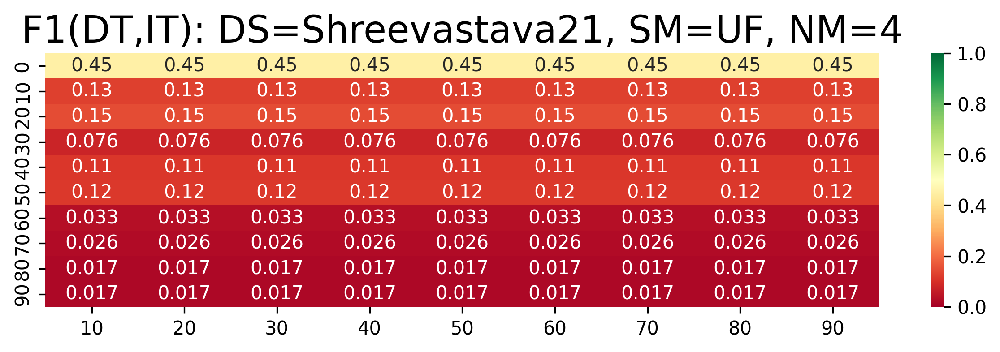

In [12]:
# Render average F1 scores for ranges of NM, SM, and IT and range of DT 

m = build_triple_matrix(summary_weighted,0,3,{2:SM,1:IT},6,n_max_values,detection_thresholds)
matrix_plot(n_max_values, detection_thresholds, m, 1.0, title = f'F1(DT,NM): DS={DS}, SM={SM}, IT={IT}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary_weighted,2,3,{0:NM,1:IT},6,selection_metrics,detection_thresholds)
matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={IT}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary_weighted,1,3,{0:NM,2:SM},6,inclusion_thresholds, detection_thresholds)
matrix_plot(sorted(inclusion_thresholds), detection_thresholds, m, 1.0, title = f'F1(DT,IT): DS={DS}, SM={SM}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


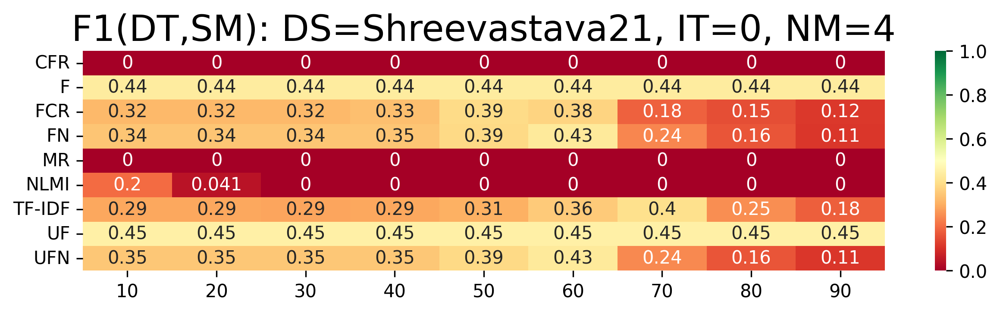

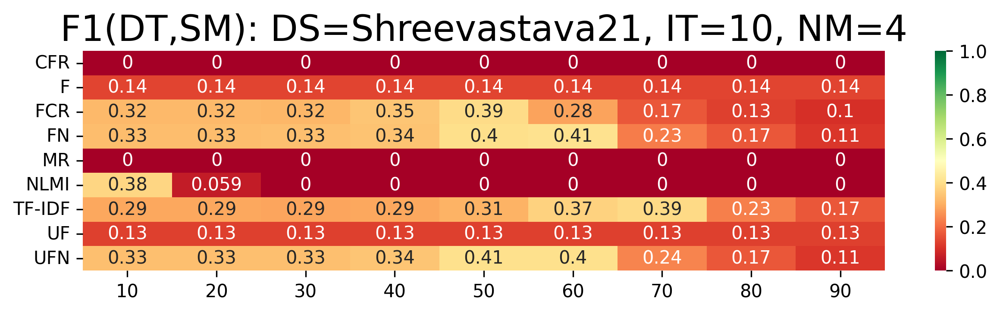

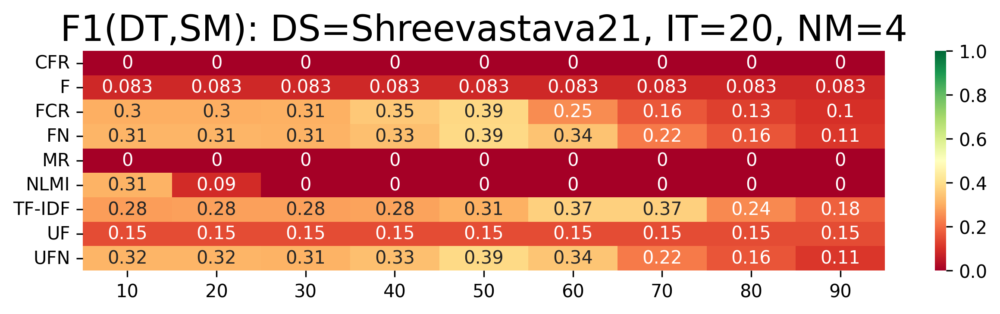

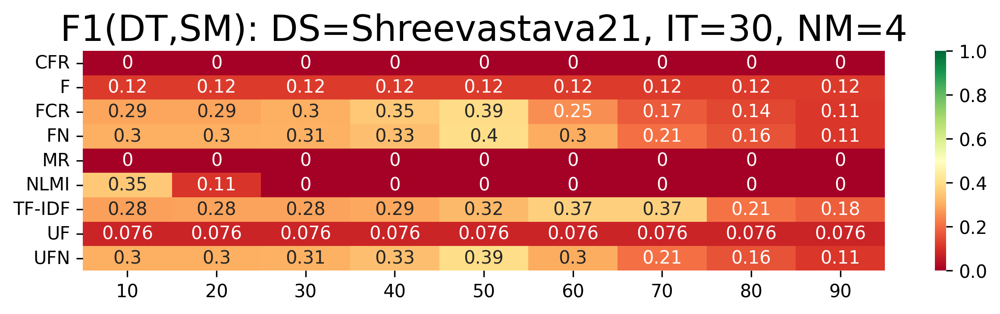

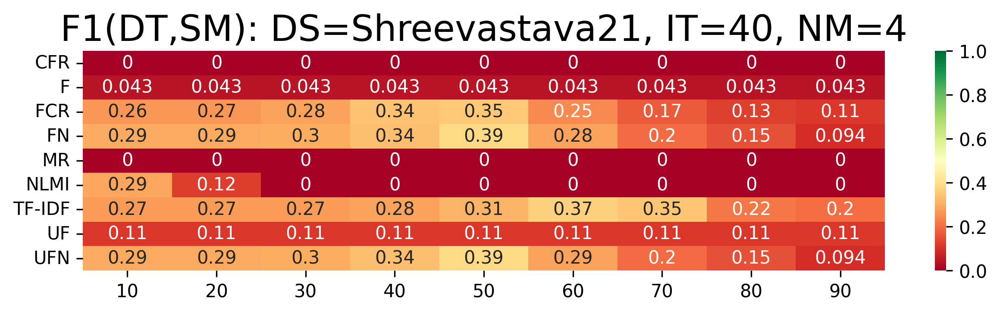

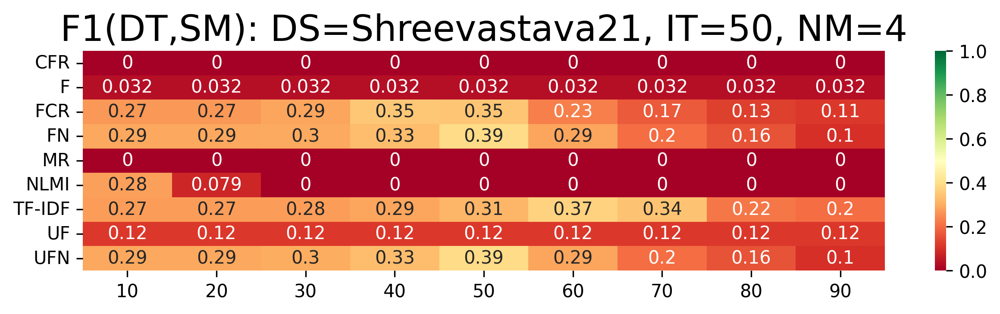

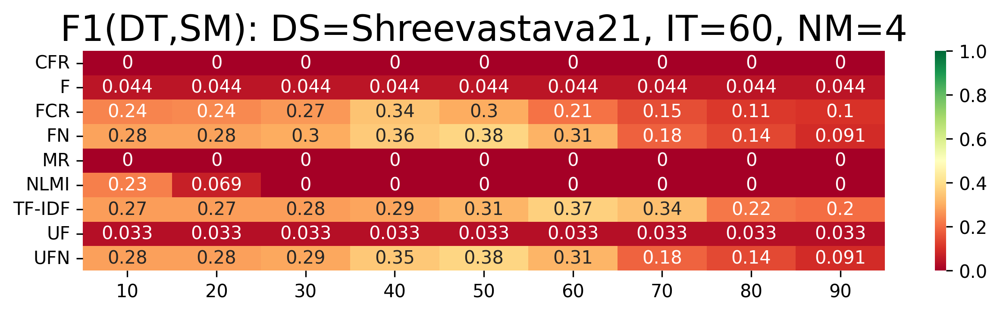

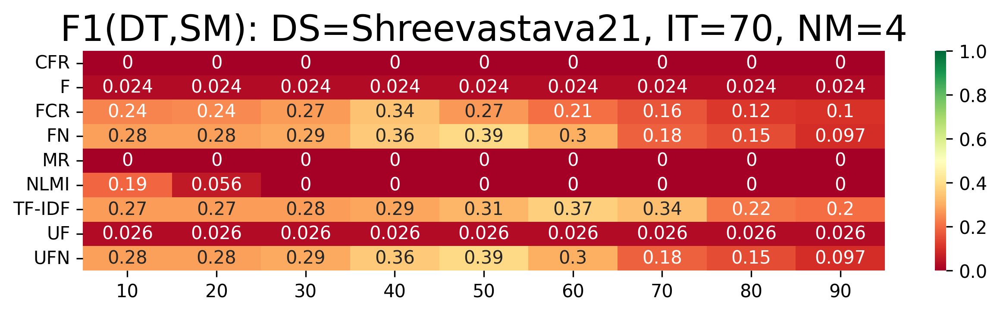

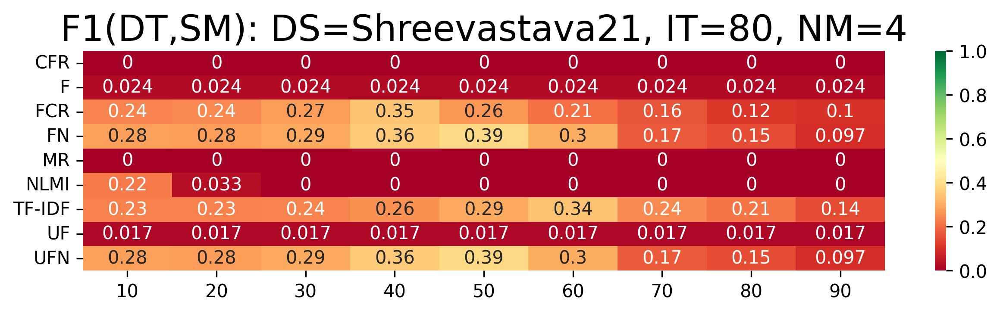

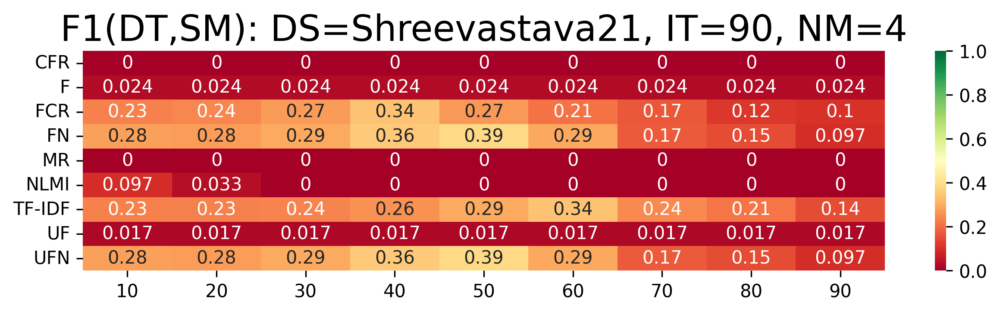

In [13]:
# Visualize how different SM perform with different IT and DT

for it in inclusion_thresholds:
    m = build_triple_matrix(summary_weighted,2,3,{0:NM,1:it},6,selection_metrics,detection_thresholds)
    matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={it}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


## Summary

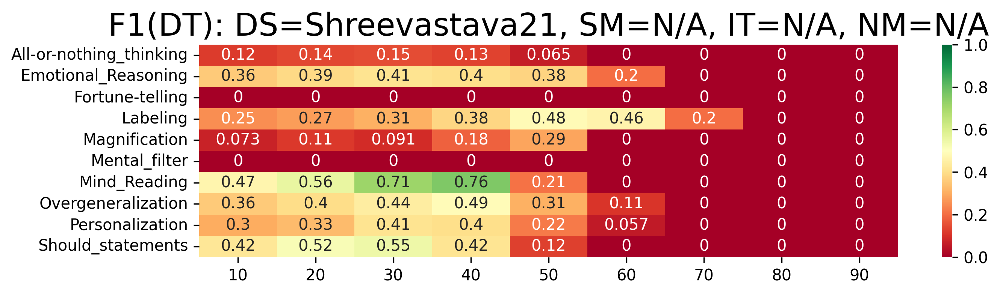

('N/A', 'N/A', 'N/A', 40, 0.3155206991937677, {'All-or-nothing_thinking': 0.13186813186813187, 'Emotional_Reasoning': 0.4, 'Fortune-telling': 0, 'Labeling': 0.37974683544303794, 'Magnification': 0.1818181818181818, 'Mental_filter': 0, 'Mind_Reading': 0.7586206896551724, 'Overgeneralization': 0.4864864864864865, 'Personalization': 0.39999999999999997, 'Should_statements': 0.4166666666666667})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.13, 0.4, 0, 0.38, 0.18, 0, 0.76, 0.49, 0.4, 0.42]


In [14]:
# Paper section: "Results and Discussion"

# Evaluate baseline model (Arinicheva and Kolonin 2025) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_base = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_base, df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_arinicheva = [round(best[5][label],2) for label in labels]
print(numbers_arinicheva)

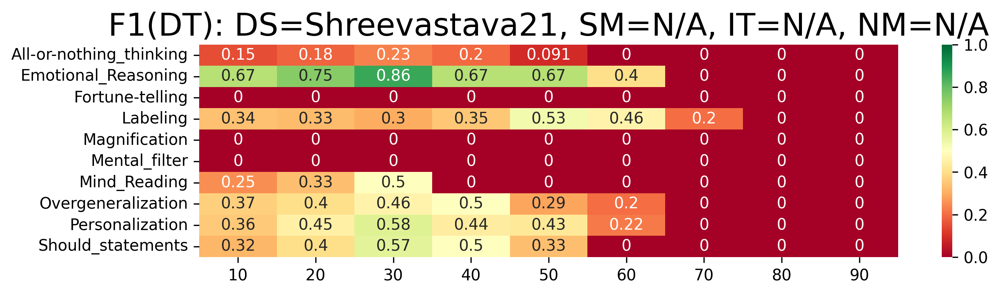

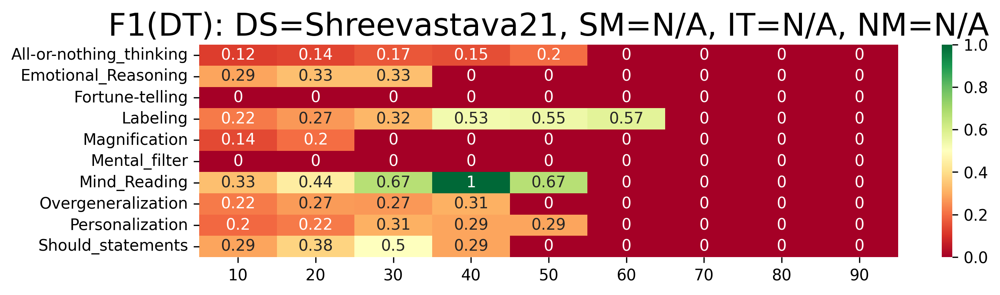

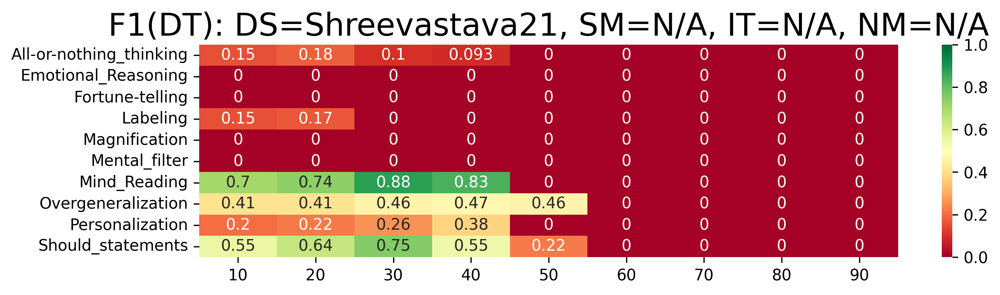

In [15]:
# Evaluate baseline model (Arinicheva and Kolonin 2025) within 3 splits

validation_fraction = 5
results_base = []
for shift in splits:
    test_df  = df[(df.index + shift) % validation_fraction == 0]
    accumulator_base = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

In [16]:
# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_base = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_base.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_base = sorted(summary_base, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_base[0]

('N/A',
 'N/A',
 'N/A',
 30,
 0.24446029776674943,
 0.3504212454212455,
 0.283661369096853,
 15.690040684061337)

In [17]:
# Enter baseline F1 performance from the paper (Babacan, O˘guz, and Beyito˘glu 2025)
# https://dergipark.org.tr/tr/download/article-file/3865878, page 7

base_babakan = {'Mind_Reading': 0.6415,
'Should_statements': 0.4615,
'All-or-nothing_thinking': 0.2041,
'Overgeneralization': 0.4928,
'Mental_filter': 0.0000,
'Magnification': 0.0000,
'Emotional_Reasoning': 0.1250,
'Personalization': 0.3913,
'Fortune-telling': 0.4348,
'Labeling': 0.5000}
numbers_babakan = [round(base_babakan[label],2) for label in labels]
print(numbers_babakan)

[0.2, 0.12, 0.43, 0.5, 0.0, 0.0, 0.64, 0.49, 0.39, 0.46]


4 0 UF 10
Shift=0: train=1821, test=456
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 667, 'Fortune-telling': 144, 'Emotional_Reasoning': 121, 'Magnification': 173, 'Mind_Reading': 214, 'Personalization': 138, 'Overgeneralization': 206, 'All-or-nothing_thinking': 89, 'Labeling': 147, 'Mental_filter': 120, 'Should_statements': 99})


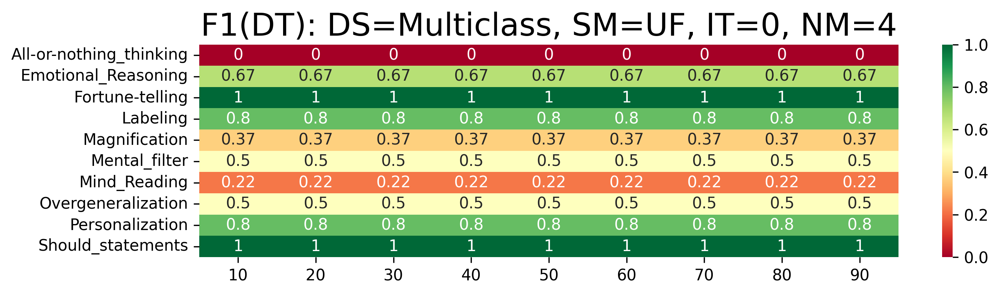

(4, 0, 'UF', 10, 0.5854171547572563, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0.6666666666666666, 'Fortune-telling': 1.0, 'Labeling': 0.8, 'Magnification': 0.36923076923076925, 'Mental_filter': 0.5, 'Mind_Reading': 0.2182741116751269, 'Overgeneralization': 0.5, 'Personalization': 0.8, 'Should_statements': 1.0})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.67, 1.0, 0.8, 0.37, 0.5, 0.22, 0.5, 0.8, 1.0]


In [18]:
# Re-compute distiortion-specific F1 performances

print(NM,IT,SM,DT) # 2 10 FCR 70
shift = 0

accumulator = []
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=True, f1_score=True, split_shift=shift, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_ours = [round(best[5][label],2) for label in labels]
print(numbers_ours)

In [19]:
# Visualize distiortion-specific F1 performances

metric_names = labels
model_metrics = {
'babakan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours25': numbers_ours
}
fig = go.Figure()
for i in range(len(labels)):
    fig.add_trace(go.Bar(
        name=metric_names[i],
        x=list(model_metrics), y=[model_metrics[m][i] for m in model_metrics],
    ))
fig.update_layout(
    barmode='group', # Group bars by model
    title='F1 by model and label', # Add a title
    xaxis_title='Model', # Label the x-axis
    yaxis_title='F1', # Label the y-axis
    hovermode='closest' # Improve hover behavior
)
fig.show()

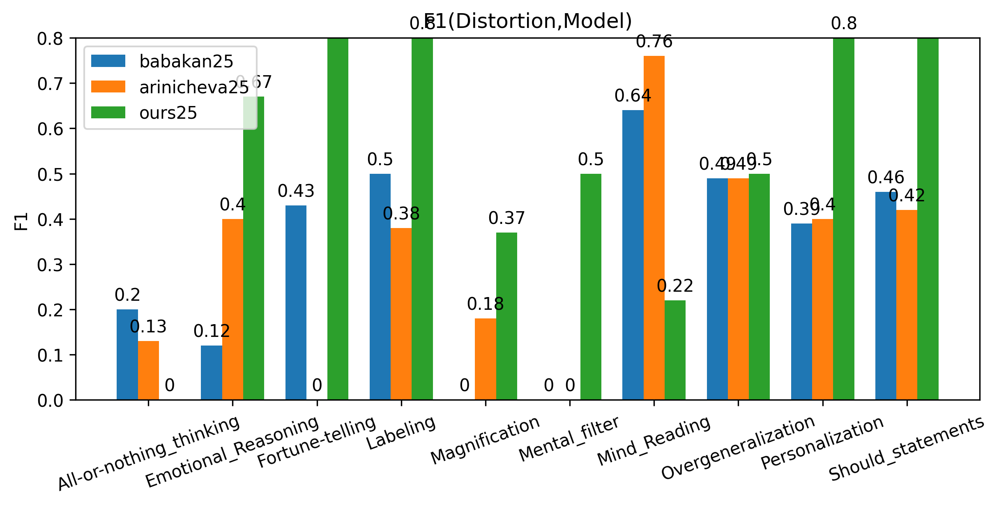

In [20]:
# Visualize distiortion-specific F1 performances

# Paper Figure 4

values = {
'babakan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours25': numbers_ours
}

plt.rcParams["figure.figsize"] = (8,4)

x = np.arange(len(labels))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in values.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1')
ax.set_title('F1(Distortion,Model)')
ax.set_xticks(x + width, labels)
ax.legend(loc='upper left')#, ncols=3)
ax.set_ylim(0, 0.8)
ax.tick_params(axis='x', rotation=20)
fig.set_dpi(300)

plt.show()

F1 babakan25: 0.4467
F1 arinicheva25: 0.283661369096853%
F1 ours25: 0.4170719375370538%
F1 ours25-weighted: 0.4501942131797456%
MPE arinicheva25: 15.690040684061337%
MPE ours25: 12.360430393150265%
MPE ours25-weighted: 24.82371194360533%


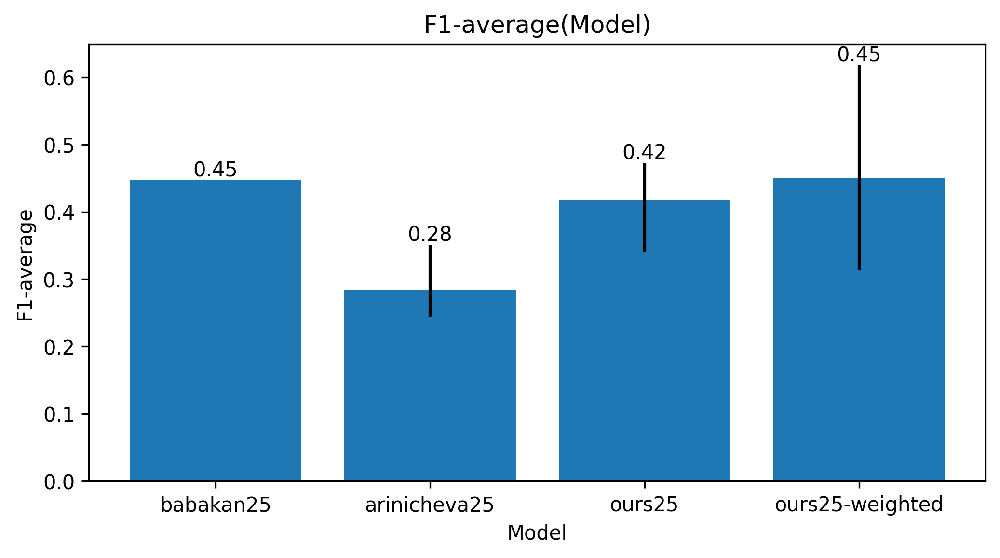

In [21]:
# Visualize grand baseline and our peformances, refering to papers 
# (Arinicheva and Kolonin 2025; Babacan, O˘guz, and Beyito˘glu 2025) 

# Paper Figure 2

# https://dergipark.org.tr/tr/download/article-file/3865878, page 7
print(f'F1 babakan25: 0.4467')
print(f'F1 arinicheva25: {summary_base[0][6]}%')
print(f'F1 ours25: {summary[0][6]}%')
print(f'F1 ours25-weighted: {summary_weighted[0][6]}%')
print(f'MPE arinicheva25: {summary_base[0][7]}%')
print(f'MPE ours25: {summary[0][7]}%')
print(f'MPE ours25-weighted: {summary_weighted[0][7]}%')
plot_bar_from_list_minmax('Model',['babakan25','arinicheva25','ours25','ours25-weighted'],
                          'F1-average',[0.4467,summary_base[0][6],summary[0][6],summary_weighted[0][6]],
                          minmax=[(0.4467,0.4467),(summary_base[0][4],summary_base[0][5]),
                                  (summary[0][4],summary[0][5]),(summary_weighted[0][4],summary_weighted[0][5])])

# Illustrate Explainabillity-Intepretability Markup

In [22]:
#https://stackoverflow.com/questions/35731194/how-to-highlight-a-word-found-in-a-text-file
def get_fragment_indexes(text,ngrams):
    text = text.lower()
    pats = [' '.join(ngram) for ngram in ngrams]
    minpos = len(text)
    maxpos = 0
    for pat in pats:
        startpos = text.find(pat)
        if startpos > -1:
            endpos = startpos + len(pat)
            if minpos > startpos:
                minpos = startpos
            if maxpos < endpos:
                maxpos = endpos
    return minpos, maxpos


def highlight_text_console(text,ngrams,backcolor,fontcolor):
    minpos, maxpos = get_fragment_indexes(text,ngrams)
    if minpos < maxpos:
        return text[0:minpos]+f'\033[4{backcolor};3{fontcolor}m'+text[minpos:maxpos]+'\033[m'+text[maxpos:len(text)]
    return text


In [23]:
# Paper section: "Methodology"
# Paper sub-section: "Interpretability"
# Paper Figure 1

explanation = {}
text = "Whatever happens, I feel like she does not believe my words and actions."
distortions = tm_base.get_sentiment_words(text,explanation)
distortion = sorted([(d,distortions[d]) for d in distortions],key=lambda x:-x[1])[0]
print(f'Distortion: {distortion[0]}, confidence: {distortion[1]}')
print(f'Speech patterns: {explanation[distortion[0]]}')
print(highlight_text_console(text,explanation[distortion[0]],3,0)) 

Distortion: Mind_Reading, confidence: 0.72
Speech patterns: [('she', 'does', 'not', 'believe')]
Whatever happens, I feel like she does not believe my words and actions.


## Create Final Models with all Inclusion Thresholds

In [40]:
local_t0 = dt.datetime.now()

In [41]:
# Paper section: "Conclusion"

NM=4; IT=0; SM='UF'; DT=10 # Weighted

print(NM,IT,SM,DT) # 4 0 UF 10

results = []
for shift in splits:
    accumulator = []
    for n_max in [NM]:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=inclusion_thresholds,
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = [SM],
                weighted=True,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results.append(accumulator)

summ = summarize_full_test_circle(results)
print()
for s in summ[:20]:
    print(s) 

4 0 UF 10
Shift=0: train=1821, test=456
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 667, 'Fortune-telling': 144, 'Emotional_Reasoning': 121, 'Magnification': 173, 'Mind_Reading': 214, 'Personalization': 138, 'Overgeneralization': 206, 'All-or-nothing_thinking': 89, 'Labeling': 147, 'Mental_filter': 120, 'Should_statements': 99})
Shift=1: train=1822, test=455
Labels count: defaultdict(<class 'int'>, {'Labeling': 146, 'Emotional_Reasoning': 115, 'No_Distortion': 681, 'Fortune-telling': 146, 'Magnification': 168, 'Personalization': 146, 'All-or-nothing_thinking': 87, 'Mind_Reading': 209, 'Overgeneralization': 217, 'Should_statements': 94, 'Mental_filter': 109})
Shift=2: train=1822, test=455
Labels count: defaultdict(<class 'int'>, {'Labeling': 148, 'Emotional_Reasoning': 122, 'No_Distortion': 670, 'Mind_Reading': 217, 'Fortune-telling': 145, 'Personalization': 145, 'All-or-nothing_thinking': 83, 'Overgeneralization': 202, 'Mental_filter': 116, 'Should_statements': 88, 'Magn

In [42]:
local_t1 = dt.datetime.now()
local_delta = local_t1 - local_t0 
# time for recognition with multiple thresholds of 3 splits each 1/5 of the number of texts in dataset
print('Time to process single text:')
str(local_delta/len(detection_thresholds)/(len(df)*3/5))  


Time to process single text:


'0:00:00.062391'

In [43]:
# Evaluate the computing time budget

grand_t1 = dt.datetime.now()
grand_delta = grand_t1 - grand_t0
str(grand_delta)

'8 days, 2:05:07.898193'

## Re-evaluate models on 10% withheld dataset (held_df)

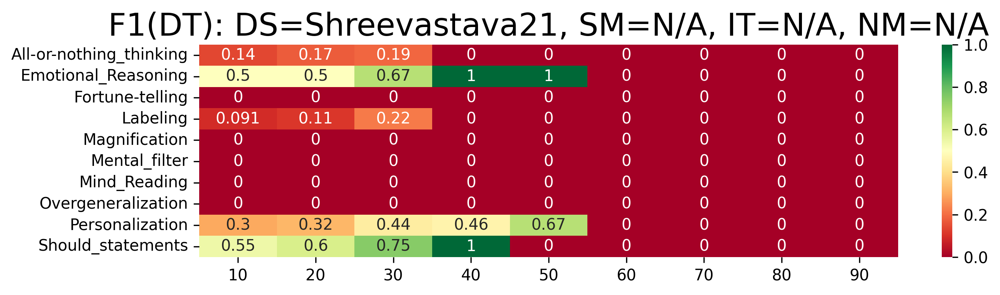

('N/A', 'N/A', 'N/A', 40, 0.24615384615384617, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 1.0, 'Fortune-telling': 0, 'Labeling': 0, 'Magnification': 0, 'Mental_filter': 0, 'Mind_Reading': 0, 'Overgeneralization': 0, 'Personalization': 0.46153846153846156, 'Should_statements': 1.0})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 1.0, 0, 0, 0, 0, 0, 0, 0.46, 1.0]


In [58]:
# Paper section: "Results and Discussion"

# Evaluate baseline model (Arinicheva and Kolonin 2025) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_base = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_base, held_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_arinicheva = [round(best[5][label],2) for label in labels]
print(numbers_arinicheva)


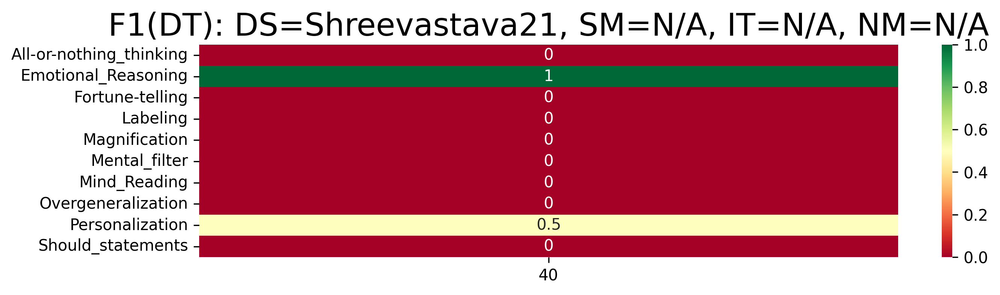

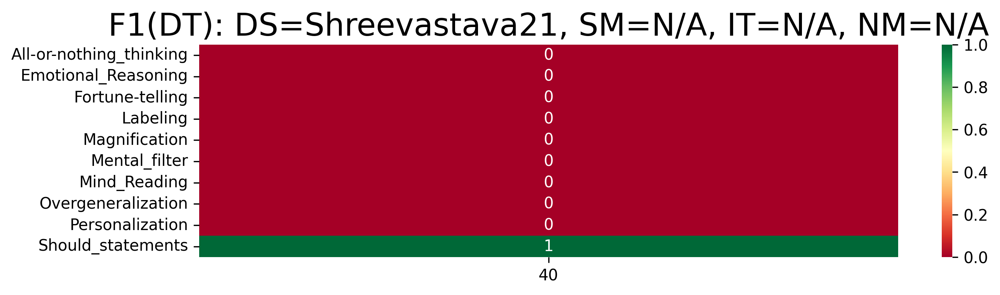

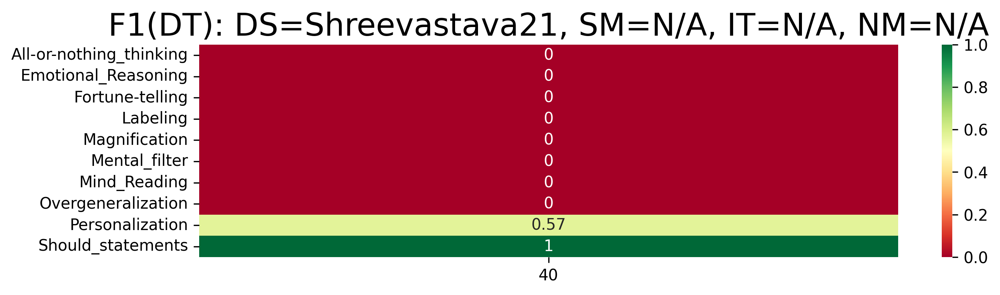

('N/A',
 'N/A',
 'N/A',
 40,
 0.1,
 0.15714285714285717,
 0.1357142857142857,
 17.543859649122815)

In [61]:
# Evaluate baseline model (Arinicheva and Kolonin 2025) within 3 splits

detection_thresholds = [40] # based on the above

results_base = []
for shift in splits:
    test_df  = held_df[(held_df.index + shift) % 3 == 0]
    accumulator_base = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_base = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_base.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_base = sorted(summary_base, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_base[0]

In [47]:
all_metrics = {'All-or-nothing_thinking',
              'Fortune-telling',
              'Mental_filter',
              'Overgeneralization',
              'Labeling',
              'Mind_Reading',
              'Personalization',
              'Emotional_Reasoning',
              'Magnification',
              'Should_statements'}

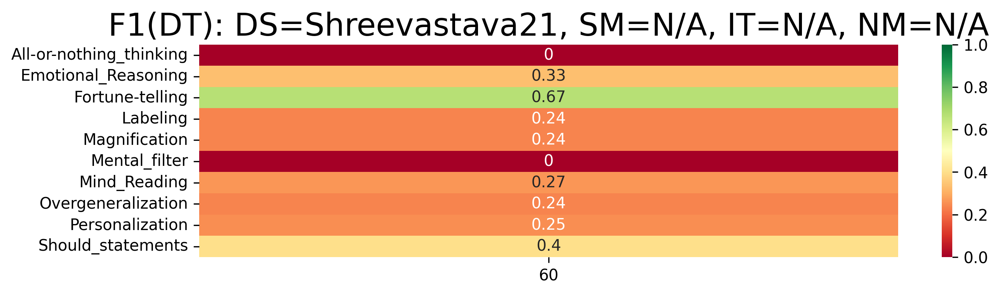

('N/A', 'N/A', 'N/A', 60, 0.26241701990530725, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0.33333333333333337, 'Fortune-telling': 0.6666666666666666, 'Labeling': 0.23529411764705882, 'Magnification': 0.23529411764705882, 'Mental_filter': 0, 'Mind_Reading': 0.2654867256637168, 'Overgeneralization': 0.2380952380952381, 'Personalization': 0.25, 'Should_statements': 0.4, 'Distortion': 0.7952380952380952})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.8, 0.33, 0.67, 0.24, 0.24, 0, 0.27, 0.24, 0.25, 0.4]


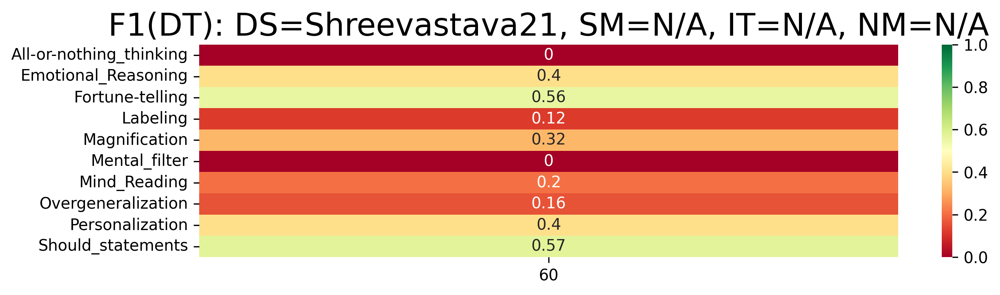

('N/A', 'N/A', 'N/A', 60, 0.2724221203632968, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0.4, 'Fortune-telling': 0.5555555555555556, 'Labeling': 0.11764705882352941, 'Magnification': 0.3181818181818182, 'Mental_filter': 0, 'Mind_Reading': 0.20454545454545456, 'Overgeneralization': 0.1568627450980392, 'Personalization': 0.4, 'Should_statements': 0.5714285714285715, 'Distortion': 0.7952380952380952})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.8, 0.4, 0.56, 0.12, 0.32, 0, 0.2, 0.16, 0.4, 0.57]


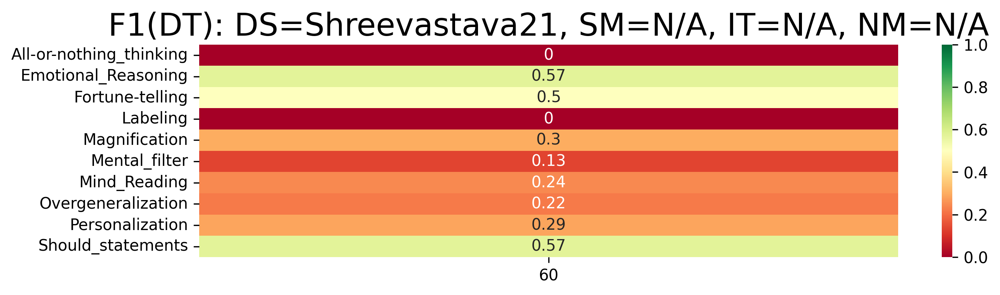

('N/A', 'N/A', 'N/A', 60, 0.28244235669767587, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0.5714285714285715, 'Fortune-telling': 0.5, 'Labeling': 0, 'Magnification': 0.2978723404255319, 'Mental_filter': 0.13333333333333333, 'Mind_Reading': 0.2424242424242424, 'Overgeneralization': 0.2222222222222222, 'Personalization': 0.2857142857142857, 'Should_statements': 0.5714285714285715, 'Distortion': 0.7952380952380952})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.8, 0.57, 0.5, 0, 0.3, 0.13, 0.24, 0.22, 0.29, 0.57]


('N/A',
 'N/A',
 'N/A',
 60,
 0.26241701990530725,
 0.28244235669767587,
 0.2724271656554267,
 2.450854712709213)

In [63]:
# Evaluate F1 on withheld test set - unweighted

IT = 0
detection_thresholds = [60]

results_base = []
for shift in splits:
    tm_base = TextMetrics(language_metrics('',all_metrics,path=model_multiclass_path+f'/multiclass-{shift+1}-{IT}')
                      ,encoding="utf-8",metric_logarithmic=True,weighted=False,debug=False)

    test_df  = held_df#[(held_df.index + shift) % 3 == 0]
    accumulator = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                    selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1,
                    binary='Distortion', accumulator=accumulator)

    best = sorted(accumulator, key=lambda x: (-x[4]))[0]
    print(best)
    labels = sorted(list(best[5]))
    print(labels)
    numbers_arinicheva = [round(best[5][label],2) for label in labels]
    print(numbers_arinicheva)
    results_base.append(accumulator)
    
# Print F1 performance for unweighted

summary_unweighted = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_unweighted.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_unweighted = sorted(summary_unweighted, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_unweighted[0]

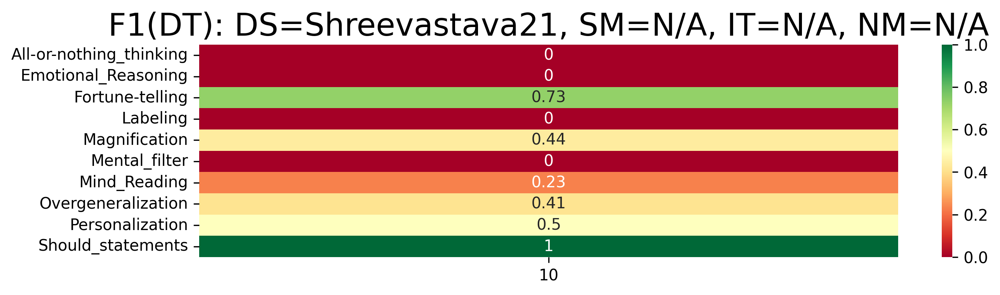

('N/A', 'N/A', 'N/A', 10, 0.33130999297027697, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0, 'Fortune-telling': 0.7272727272727273, 'Labeling': 0, 'Magnification': 0.43902439024390244, 'Mental_filter': 0, 'Mind_Reading': 0.23300970873786409, 'Overgeneralization': 0.41379310344827586, 'Personalization': 0.5, 'Should_statements': 1.0, 'Distortion': 0.7952380952380952})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.8, 0, 0.73, 0, 0.44, 0, 0.23, 0.41, 0.5, 1.0]


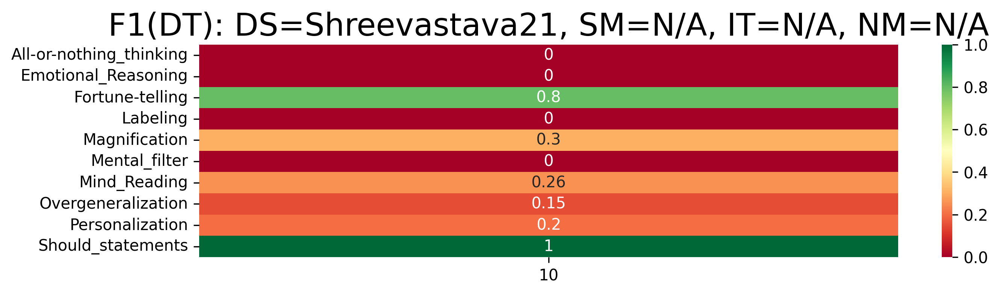

('N/A', 'N/A', 'N/A', 10, 0.2713389417407029, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0, 'Fortune-telling': 0.8, 'Labeling': 0, 'Magnification': 0.30434782608695654, 'Mental_filter': 0, 'Mind_Reading': 0.2571428571428572, 'Overgeneralization': 0.1518987341772152, 'Personalization': 0.19999999999999998, 'Should_statements': 1.0, 'Distortion': 0.7952380952380952})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.8, 0, 0.8, 0, 0.3, 0, 0.26, 0.15, 0.2, 1.0]


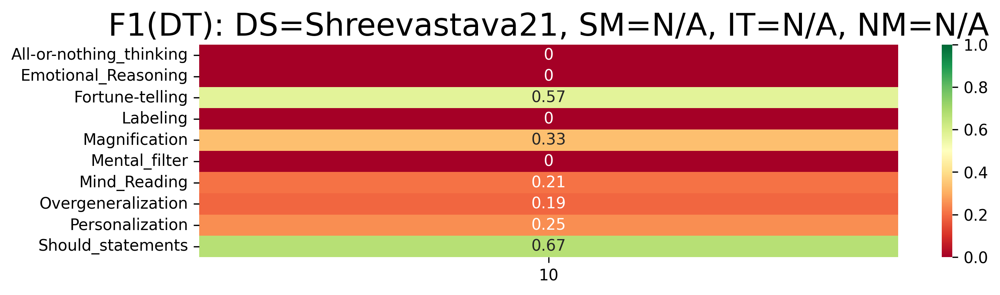

('N/A', 'N/A', 'N/A', 10, 0.22212070874861573, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0, 'Fortune-telling': 0.5714285714285715, 'Labeling': 0, 'Magnification': 0.33333333333333337, 'Mental_filter': 0, 'Mind_Reading': 0.20930232558139536, 'Overgeneralization': 0.1904761904761905, 'Personalization': 0.25, 'Should_statements': 0.6666666666666666, 'Distortion': 0.7952380952380952})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.8, 0, 0.57, 0, 0.33, 0, 0.21, 0.19, 0.25, 0.67]


('N/A',
 'N/A',
 'N/A',
 10,
 0.22212070874861573,
 0.33130999297027697,
 0.27492321448653184,
 13.673339927309636)

In [64]:
# Evaluate F1 on withheld test set - weighted

IT = 0
detection_thresholds = [10]

results_base = []
for shift in splits:
    tm_base = TextMetrics(language_metrics('',all_metrics,path=model_multiclass_path+f'/multiclass-{shift+1}-0')
                      ,encoding="utf-8",metric_logarithmic=True,weighted=True,debug=False)

    test_df  = held_df #[(held_df.index + shift) % 3 == 0]
    accumulator = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                    selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1,
                    binary='Distortion', accumulator=accumulator)

    best = sorted(accumulator, key=lambda x: (-x[4]))[0]
    print(best)
    labels = sorted(list(best[5]))
    print(labels)
    numbers_arinicheva = [round(best[5][label],2) for label in labels]
    print(numbers_arinicheva)
    results_base.append(accumulator)
    
# Print F1 performance of weighted

summary_weighted = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_weighted.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_weighted = sorted(summary_weighted, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_weighted[0]

In [65]:
#TODO why our model is so DT-agnostic?
#TODO why our model is worse than 0.32 (actual Babakan)
